Using cuda for inference


Using cache found in C:\Users\soner/.cache\torch\hub\pytorch_vision_v0.10.0
C:\Users\soner\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\soner\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet50_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet50_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


balloon1.jpg


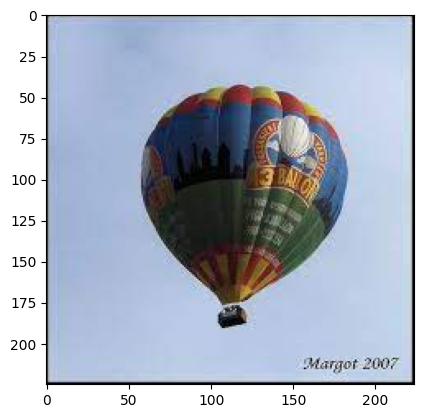

balloon 0.9998101592063904
parachute, chute 9.454850805923343e-05
airship, dirigible 6.696293712593615e-05
water tower 1.9841079847537912e-05
maraca 2.353458739889902e-06


balloon2.jpg


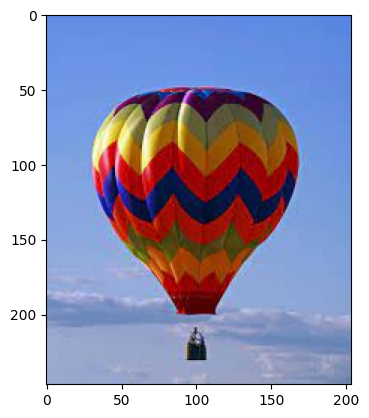

balloon 0.999462902545929
parachute, chute 0.0004081143706571311
airship, dirigible 3.8518945075338706e-05
water tower 1.1854756849061232e-05
goblet 6.588507403648691e-06


barbell1.jpg


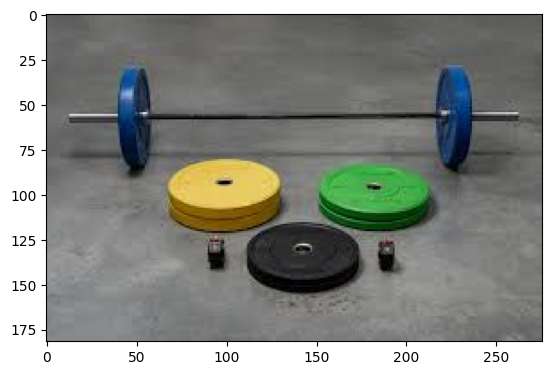

barbell 0.6724472045898438
dumbbell 0.15842029452323914
puck, hockey puck 0.10310905426740646
pencil sharpener 0.007134121842682362
reel 0.00665094843134284


barbell2.jpg


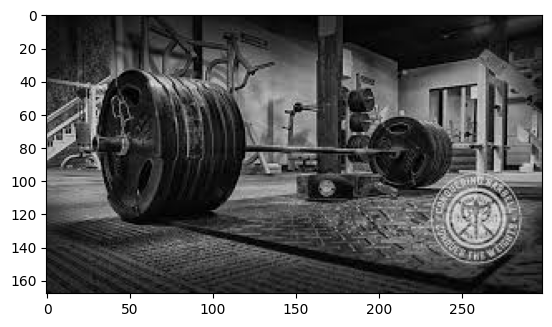

barbell 0.2599419355392456
dumbbell 0.17580032348632812
tractor 0.13103801012039185
lumbermill, sawmill 0.09215904027223587
cannon 0.08906415849924088


labrador1.jpg


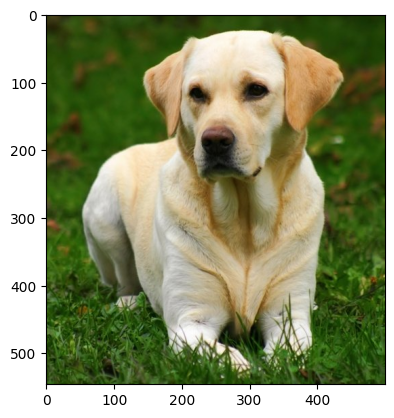

Labrador retriever 0.9697464108467102
golden retriever 0.010549561120569706
Rhodesian ridgeback 0.0050400299951434135
bull mastiff 0.0033567657228559256
Great Dane 0.0013501486973837018


labrador2.jpg


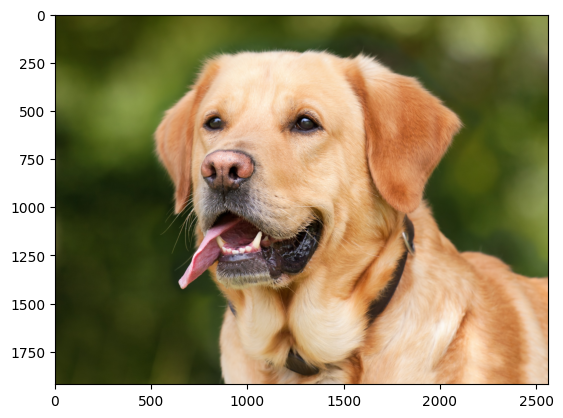

Labrador retriever 0.504709780216217
golden retriever 0.4034472107887268
tennis ball 0.011713782325387001
Rhodesian ridgeback 0.009297271259129047
soccer ball 0.0070717353373765945


ski1.jpg


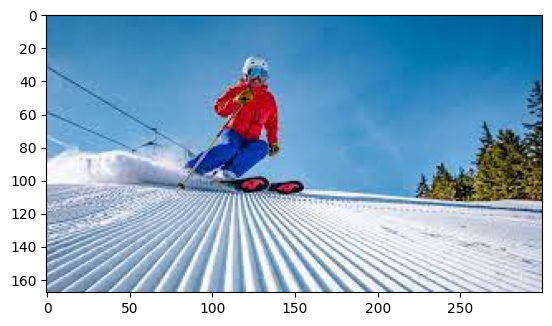

ski 0.764347493648529
solar dish, solar collector, solar furnace 0.08306211233139038
parachute, chute 0.06605026125907898
snowmobile 0.021570589393377304
speedboat 0.014199781231582165


ski2.jpg


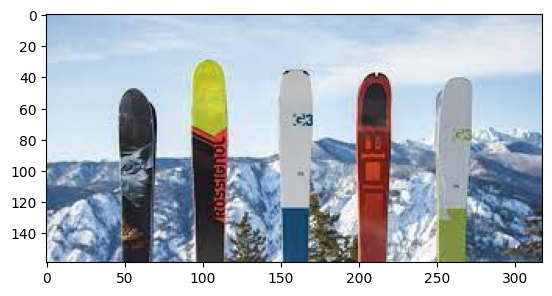

ski 0.9948790073394775
ballpoint, ballpoint pen, ballpen, Biro 0.0010283130686730146
Band Aid 0.0005534011870622635
hair spray 0.0003913696273230016
sunscreen, sunblock, sun blocker 0.00033247689134441316


velvet1.jpg


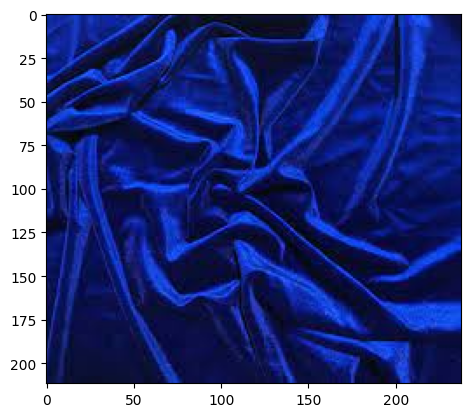

velvet 0.9846434593200684
academic gown, academic robe, judge's robe 0.007554564159363508
hoopskirt, crinoline 0.00226523051969707
mortarboard 0.0013928902335464954
overskirt 0.001291619148105383


velvet2.jpg


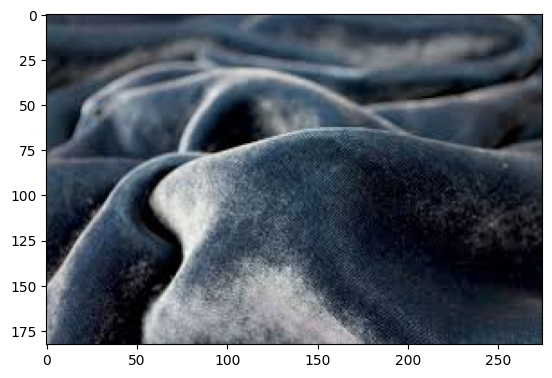

velvet 0.8661662340164185
Great Dane 0.029285039752721786
Weimaraner 0.014021331444382668
sea lion 0.008417068049311638
whippet 0.008294164203107357


['balloon', 'balloon', 'barbell', 'barbell', 'Labrador retriever', 'Labrador retriever', 'ski', 'ski', 'velvet', 'velvet']
['balloon', 'balloon', 'barbell', 'barbell', 'Labrador retriever', 'Labrador retriever', 'ski', 'ski', 'velvet', 'velvet']


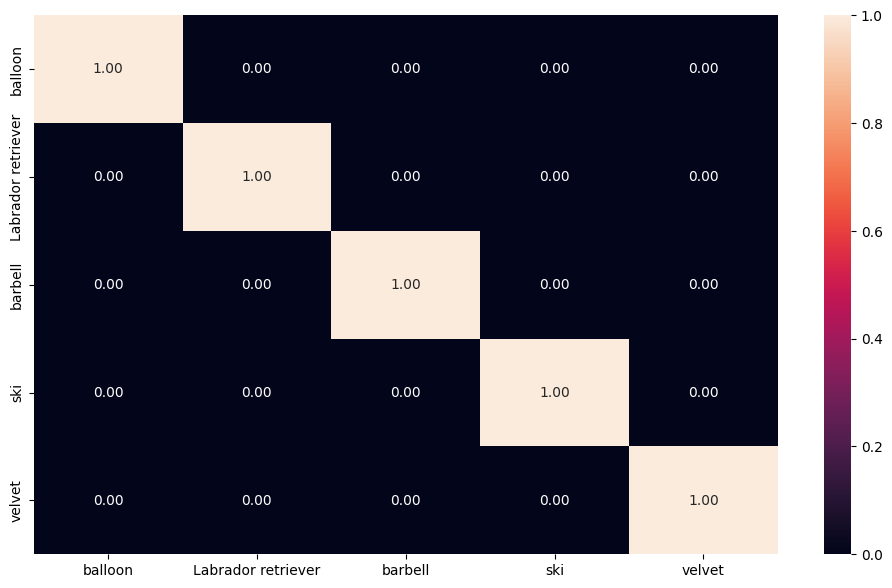

                    precision    recall  f1-score   support

Labrador retriever       1.00      1.00      1.00         2
           balloon       1.00      1.00      1.00         2
           barbell       1.00      1.00      1.00         2
               ski       1.00      1.00      1.00         2
            velvet       1.00      1.00      1.00         2

          accuracy                           1.00        10
         macro avg       1.00      1.00      1.00        10
      weighted avg       1.00      1.00      1.00        10



In [4]:
# Problem 1 - Classifying 10 images, 5 classes

import torch
import os
from PIL import Image
from torchvision import transforms
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report

import seaborn as sn
import pandas as pd
import urllib
import cv2
import matplotlib.pyplot as plt
import numpy as np
%matplotlib inline

# Debug variable(s)
DEBUG=1

# Init device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
model = model.to(device)
model.eval()


# Transform input images
preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Folder names
test_folder = "dataset"
project_folder = os.getcwd()
test_folder = os.path.join(project_folder,test_folder)

# Arrays for predictions and actual values
y_pred = []
y_true = []


for folder in os.listdir(test_folder):
    sub_directory = (os.path.join(test_folder,folder))
    if (os.path.isdir(sub_directory) == False): continue
    # print(sub_directory)
    for filename in os.listdir(sub_directory):
        print(filename)
        label = folder
        filename_path = os.path.join(sub_directory,filename)
        if (DEBUG): # if debug, then print input images
            img = cv2.imread(filename_path)
            plt.imshow(img[:,:,::-1])
            plt.show()
        

        # Evaluation
        original_img = Image.open(filename_path)
        input_tensor = preprocess(original_img)
        input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
        input_batch = input_batch.to(device)    # move batch to device

        with torch.no_grad():
            output = model(input_batch)
        
        probabilities = torch.nn.functional.softmax(output[0], dim=0)

        # Read the categories
        with open("imagenet_classes.txt", "r") as f:
            categories = [s.strip() for s in f.readlines()]
        # Show top categories per image
        top5_prob, top5_catid = torch.topk(probabilities, 5)
        for i in range(top5_prob.size(0)):
            print(categories[top5_catid[i]], top5_prob[i].item())
        print("\n")
        y_pred.append(categories[top5_catid[0]]) # Save Prediction
        y_true.append(label)


print(y_pred)
print(y_true)

# constant for classes
classes = ('balloon', 'Labrador retriever', 'barbell','ski', 'velvet')

# Build confusion matrix
cf_matrix = confusion_matrix(y_true, y_pred)
cmn = cf_matrix.astype('float') / cf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (12,7))
sn.heatmap(cmn, annot=True, fmt='.2f', xticklabels=classes, yticklabels=classes)
plt.show()

print(classification_report(y_true, y_pred))


Using cuda for inference
Dataset MNIST
    Number of datapoints: 60000
    Root location: data
    Split: Train
    StandardTransform
Transform: ToTensor()
torch.Size([60000, 28, 28])


C:\Users\soner\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:208: UserWarning: The parameter 'pretrained' is deprecated since 0.13 and will be removed in 0.15, please use 'weights' instead.
  warnings.warn(
C:\Users\soner\AppData\Local\Programs\Python\Python310\lib\site-packages\torchvision\models\_utils.py:223: UserWarning: Arguments other than a weight enum or `None` for 'weights' are deprecated since 0.13 and will be removed in 0.15. The current behavior is equivalent to passing `weights=ResNet18_Weights.IMAGENET1K_V1`. You can also use `weights=ResNet18_Weights.DEFAULT` to get the most up-to-date weights.
  warnings.warn(msg)


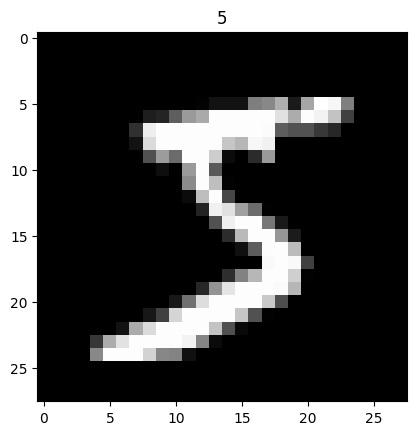

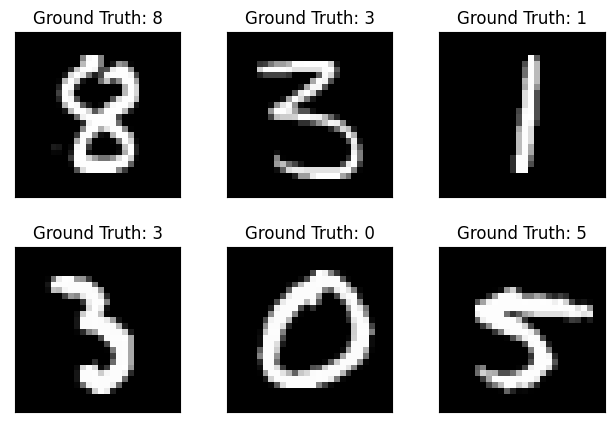

Cost at epoch 0 is 0.8278731618483861
Cost at epoch 1 is 0.4860333395520846
Cost at epoch 2 is 0.43001475584904353
Cost at epoch 3 is 0.4001152934451898
Cost at epoch 4 is 0.3786494536449512
Cost at epoch 5 is 0.36705746717254323
Cost at epoch 6 is 0.3494868779281775
Cost at epoch 7 is 0.3434449475010236
Cost at epoch 8 is 0.33708466227253275
Cost at epoch 9 is 0.3250904581795136
Finished training
Checking accuracy on Training Set
Got 55997 / 60000 with accuracy 93.33
Checking accuracy on Test Set
Got 9291 / 10000 with accuracy 92.91


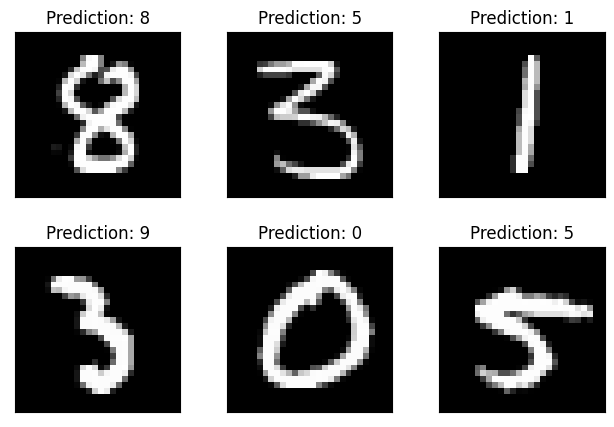

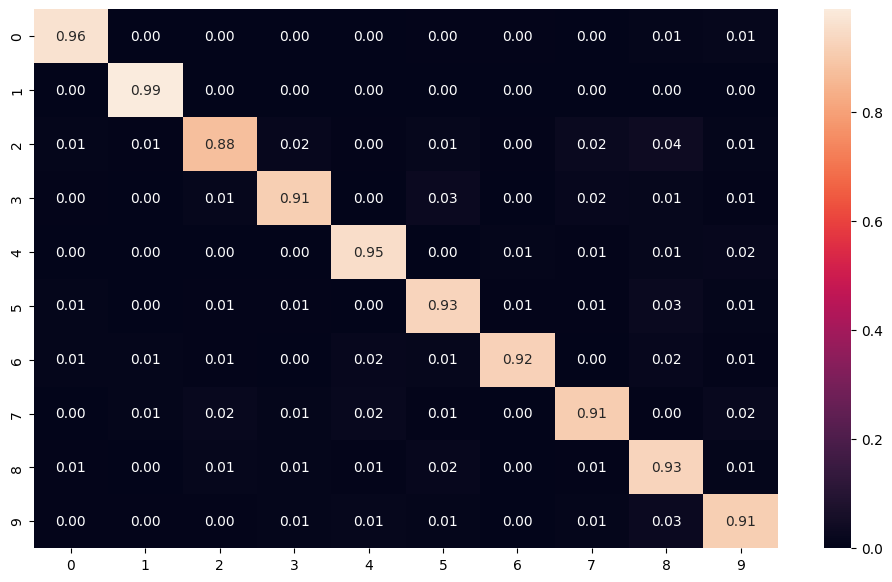

              precision    recall  f1-score   support

           0       0.95      0.96      0.96       980
           1       0.97      0.99      0.98      1135
           2       0.93      0.88      0.90      1032
           3       0.95      0.91      0.93      1010
           4       0.93      0.95      0.94       982
           5       0.90      0.93      0.91       892
           6       0.97      0.92      0.94       958
           7       0.93      0.91      0.92      1028
           8       0.85      0.93      0.89       974
           9       0.91      0.91      0.91      1009

    accuracy                           0.93     10000
   macro avg       0.93      0.93      0.93     10000
weighted avg       0.93      0.93      0.93     10000



In [5]:
# Problem 2 - MNIST classification with ResNet18

import os
import time
import copy

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader

from torchvision import datasets
from torchvision import transforms
from torchvision import models
from torch import optim

import matplotlib.pyplot as plt
from PIL import Image

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sn

DEBUG=0


# Init device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

# Init ResNet and related
model = models.resnet18(pretrained=True)
# Freeze layers
for param in model.parameters():
    param.requires_grad = False

# Unfreeze and modify last layer
for param in model.fc.parameters():
    param.requires_grad = True

# modify convolution layer, input size is (7,7) instead of (28,28)
model.conv1 = nn.Conv2d(1, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False)

# Modify number of classes/features, we only got 10 (0,1,2,...9)
num_features = model.fc.in_features
model.fc = nn.Linear(num_features,10)
model = model.to(device)



# Initialize data
train_data = datasets.MNIST(
    root = 'data',
    train = True,                         
    transform = transforms.ToTensor(), 
    download = True,            
)
test_data = datasets.MNIST(
    root = 'data', 
    train = False, 
    transform = transforms.ToTensor()
)


# Get train data size
print(train_data)
print(train_data.data.size())

# Plot one data object from MNIST
plt.imshow(train_data.data[0], cmap='gray')
plt.title('%i' % train_data.targets[0])
plt.show()


# Plot multiple data objects from MNIST
if (DEBUG == 1):
    figure = plt.figure(figsize=(10, 8))
    cols, rows = 5, 5
    for i in range(1, cols * rows + 1):
        sample_idx = torch.randint(len(train_data), size=(1,)).item()
        img, label = train_data[sample_idx]
        figure.add_subplot(rows, cols, i)
        plt.title(label)
        plt.axis("off")
        plt.imshow(img.squeeze(), cmap="gray")
    plt.show()


# prepare loaders for training and testing
train_loader = DataLoader(train_data,batch_size=32,shuffle=True)
test_loader = DataLoader(test_data, batch_size=32, shuffle=True)

# Get example batches
examples = enumerate(test_loader)
batch_idx, (example_data, example_labels) = next(examples)


# Plot the example data set
fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Ground Truth: {}".format(example_labels[i]))
  plt.xticks([])
  plt.yticks([])
plt.show()  


# Define loss, optimizer, num_epochs
loss_func = nn.CrossEntropyLoss()   
optimizer = optim.Adam(model.parameters(), lr = 0.001)   
num_epochs = 10


# Train model
def train_model(model,num_epochs,loader,loss_func,optimizer):
    for epoch in range(num_epochs):
        losses = []

        for batch_idx, (data, labels) in enumerate(loader):
            # Get data to cuda if possible
            data = data.to(device=device)
            labels = labels.to(device=device)

            # gradient descent or adam step
            optimizer.step()

            # forward
            scores = model(data)
            loss = loss_func(scores, labels)

            losses.append(loss.item())

            # backward
            optimizer.zero_grad()
            loss.backward()  

        print(f"Cost at epoch {epoch} is {sum(losses)/len(losses)}")
    print("Finished training")

# Calculate accuracy of model
def check_accuracy(loader, model):
    # Arrays for confusion matrix
    predicted = []
    actual = []
    
    # Keep track of correct output
    num_correct = 0
    num_samples = 0
    
    model.eval()

    with torch.no_grad():
        for images, labels in loader:
            # Load data to cuda if possible
            images = images.to(device=device)
            labels = labels.to(device=device)

            scores = model(images)
            _, predictions = scores.max(1)
            num_correct += (predictions == labels).sum()
            num_samples += predictions.size(0)
            temp = (torch.max(torch.exp(scores), 1)[1]).data.cpu().numpy() # for confusion matrix
            predicted.extend(temp) # for confusion matrix
            actual.extend(labels.data.cpu().numpy()) # for confusion matrix
        print(
            f"Got {num_correct} / {num_samples} with accuracy {float(num_correct)/float(num_samples)*100:.2f}"
        )

    model.train()
    return predicted, actual


# Call functions and perform
train_model(model=model,num_epochs=num_epochs,loader=train_loader,loss_func=loss_func,optimizer=optimizer)


# Arrays for output of check_accuracy
y_pred = []
y_true = []


# Check accuracy of train and test data
print("Checking accuracy on Training Set")
check_accuracy(train_loader, model)

print("Checking accuracy on Test Set")
y_pred, y_true = check_accuracy(test_loader, model)



# Get classification for example data
with torch.no_grad():
  example_data_cuda = example_data.to(device=device)  
  output = model(example_data_cuda)

# Plot output for example data
fig = plt.figure()
for i in range(6):
  plt.subplot(2,3,i+1)
  plt.tight_layout()
  plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
  plt.title("Prediction: {}".format(
    output.data.max(1, keepdim=True)[1][i].item()))
  plt.xticks([])
  plt.yticks([])
plt.show()


# Build confusion matrix
classes = ('0','1','2','3','4','5','6','7','8','9')
cf_matrix = confusion_matrix(y_true, y_pred)
cmn = cf_matrix.astype('float') / cf_matrix.sum(axis=1)[:, np.newaxis]
plt.figure(figsize = (12,7))
sn.heatmap(cmn, annot=True, fmt='.2f', xticklabels=classes, yticklabels=classes)
plt.show()

# Print recall, f-score, precision
print(classification_report(y_true, y_pred))

In [ ]:
# Problem 3 - Cats vs Dogs with 2 Networks + Fine Tuning

# Packages
import os
import time
import copy

import numpy as np
import pandas as pd

import torch
import torch.nn as nn
import torch.nn.functional as F
from torch.utils.data import DataLoader,Dataset
from torchvision.utils import make_grid


from torchvision import datasets
from torchvision import transforms
from torchvision import models
from torch import optim

import matplotlib.pyplot as plt
from PIL import Image

from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sn
from torchvision.datasets import ImageFolder


DEBUG=0

# Process images
preprocess_alex = transforms.Compose([
    transforms.Resize((256,256)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

preprocess_res= transforms.Compose([
    transforms.Resize((224,224)),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Init device
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
print(f'Using {device} for inference')

# Init models
model = models.resnet50(pretrained=True)
# Freeze layers
for param in model.parameters():
    param.requires_grad = False

# Unfreeze and modify last layer
for param in model.fc.parameters():
    param.requires_grad = True
num_features = model.fc.in_features
model.fc = nn.Linear(num_features,2)
model = model.to(device)

model2=models.alexnet(pretrained=True)
print(model2)
# Freeze layers
for param in model2.parameters():
    param.requires_grad = False
# Unfreeze last layer and modify
for param in model2.classifier[4]:
    param.requires_grad_ = True
for param in model2.classifier[6]:
    param.requires_grad_ = True
model2.classifier[4] = nn.Linear(4096,1024)
model2.classifier[6] = nn.Linear(1024,2)
model2 = model2.to(device)

# Define loss, optimizer, num_epochs
loss_func = nn.CrossEntropyLoss()   
optimizer = optim.Adam(model.parameters(), lr = 0.001)  
optimizer2 = optim.Adam(model2.parameters(), lr = 0.001)   
num_epochs = 3

# Prepare data
train_data = ImageFolder(root='dog_cat/training_set',transform=preprocess_res)
test_data = ImageFolder(root='dog_cat/test_set',transform=preprocess_res)

# DataLoaders
train_loader = DataLoader(train_data,batch_size=32,shuffle=True)
test_loader = DataLoader(test_data, batch_size=32, shuffle=True)

# Get example batches
examples = enumerate(test_loader)
batch_idx, (example_data, example_labels) = next(examples)

print(train_data.classes)



# Helper functions

# Plot example data
def plot_example(data,labels):
# Plot the example data set
    fig = plt.figure()
    for i in range(6):
        plt.subplot(2,3,i+1)
        plt.tight_layout()
        img = data[i][0]
        # img.thumbnail((256,256), Image.ANTIALIAS)
        plt.imshow(img, cmap='gray',interpolation='none')
        plt.title("Ground Truth: {}".format(labels[i]))
        plt.xticks([])
        plt.yticks([])
    plt.show()  

# Train model
def train_model(model,num_epochs,loader,loss_func,optimizer):
    for epoch in range(num_epochs):
        losses = []

        for batch_idx, (data, labels) in enumerate(loader):
            # Get data to cuda if possible
            data = data.to(device=device)
            labels = labels.to(device=device)

            # gradient descent or adam step
            optimizer.step()

            # forward
            scores = model(data)
            loss = loss_func(scores, labels)

            losses.append(loss.item())

            # backward
            optimizer.zero_grad()
            loss.backward()  

        print(f"Cost at epoch {epoch} is {sum(losses)/len(losses)}")
    print("Finished training")

# Calculate accuracy of model
def check_accuracy(loader, model):
    # Arrays for confusion matrix
    predicted = []
    actual = []
    
    # Keep track of correct output
    num_correct = 0
    num_samples = 0
    
    model.eval()

    with torch.no_grad():
        for images, labels in loader:
            # Load data to cuda if possible
            images = images.to(device=device)
            labels = labels.to(device=device)

            scores = model(images)
            _, predictions = scores.max(1)
            num_correct += (predictions == labels).sum()
            num_samples += predictions.size(0)
            temp = (torch.max(torch.exp(scores), 1)[1]).data.cpu().numpy() # for confusion matrix
            predicted.extend(temp) # for confusion matrix
            actual.extend(labels.data.cpu().numpy()) # for confusion matrix
        print(
            f"Got {num_correct} / {num_samples} with accuracy {float(num_correct)/float(num_samples)*100:.2f}"
        )

    model.train()
    return predicted, actual

# Evaluate on one example from testset
def eval_example(exp_data):
    # Get classification for example data
    with torch.no_grad():
        exp_data_cuda = exp_data.to(device=device)  
        output = model(exp_data_cuda)

    # Plot output for example data
    fig = plt.figure()
    for i in range(6):
        plt.subplot(2,3,i+1)
        plt.tight_layout()
        plt.imshow(example_data[i][0], cmap='gray', interpolation='none')
        plt.title("Prediction: {}".format(
            output.data.max(1, keepdim=True)[1][i].item()))
        plt.xticks([])
        plt.yticks([])
    plt.show()

# Build confusion matrix
def conf_matrix(true,prediction):
    # Build confusion matrix
    classes = ('cats','dogs')
    cf_matrix = confusion_matrix(y_true, y_pred)
    cm = cf_matrix.astype('float') / cf_matrix.sum(axis=1)[:, np.newaxis]
    plt.figure(figsize = (12,7))
    sn.heatmap(cm, annot=True, fmt='.2f', xticklabels=classes, yticklabels=classes)
    plt.show()

    # Print recall, f-score, precision
    print(classification_report(true, prediction))

# Execution of ResNet
plot_example(example_data,example_labels)
train_model(model=model,num_epochs=num_epochs,loader=train_loader,loss_func=loss_func,optimizer=optimizer)

# Arrays for output of check_accuracy
y_pred = []
y_true = []


# Check accuracy of train and test data
print("Checking accuracy on Training Set")
check_accuracy(train_loader, model)

print("Checking accuracy on Test Set")
y_pred, y_true = check_accuracy(test_loader, model)

# Evaluate example
eval_example(example_data)
conf_matrix(y_true,y_pred)



# Execution of AlexNet
plot_example(example_data,example_labels)
train_model(model=model2,num_epochs=num_epochs,loader=train_loader,loss_func=loss_func,optimizer=optimizer2)

# Arrays for output of check_accuracy
y_pred_2 = []
y_true_2 = []


# Check accuracy of train and test data
print("Checking accuracy on Training Set")
check_accuracy(train_loader, model2)

print("Checking accuracy on Test Set")
y_pred_2, y_true_2 = check_accuracy(test_loader, model2)

# Evaluate example
eval_example(example_data)
conf_matrix(y_true_2,y_pred_2)


Using cache found in C:\Users\soner/.cache\torch\hub\pytorch_vision_v0.10.0


C:\Users\soner\Desktop\Robotics-ComputerVision\Project1\noisy_folder


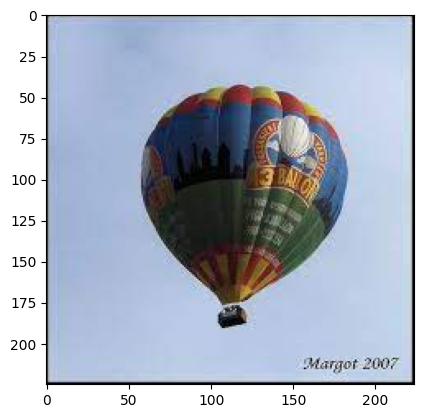

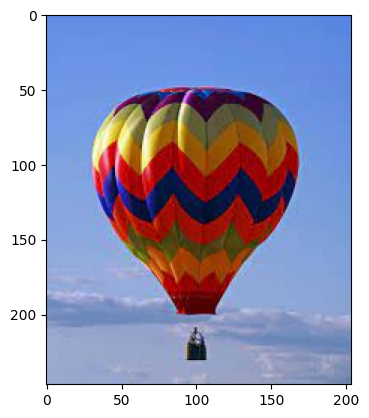

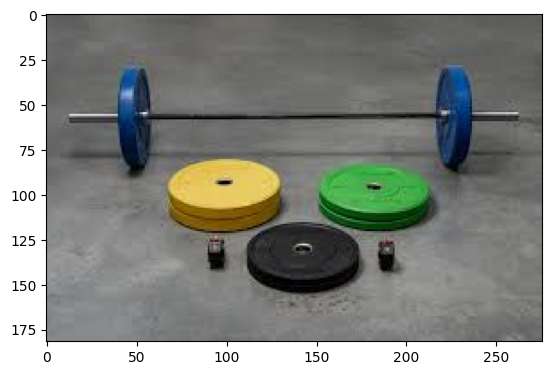

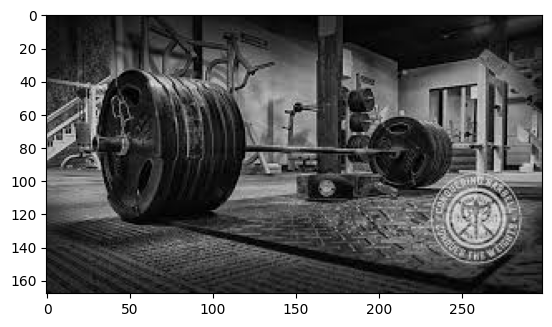

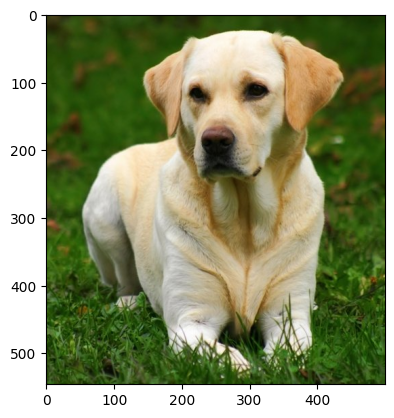

...

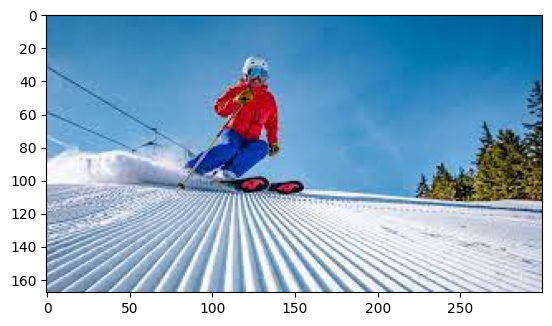

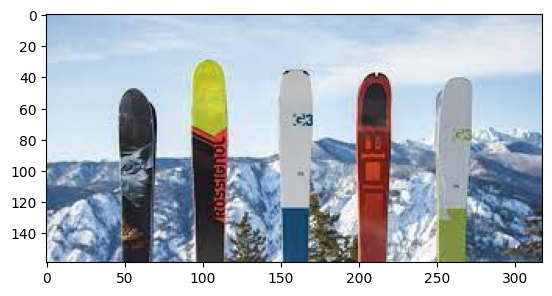

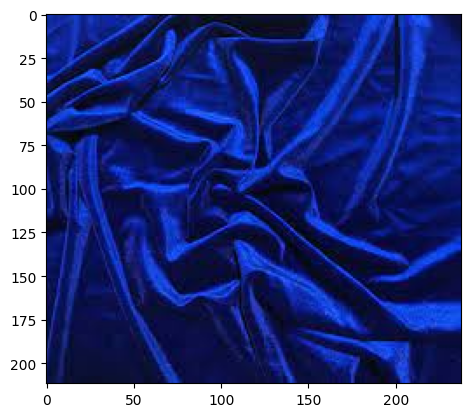

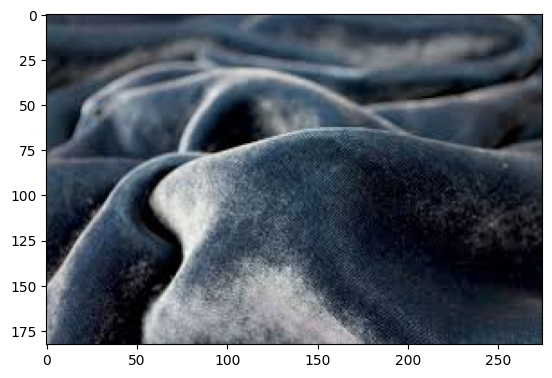

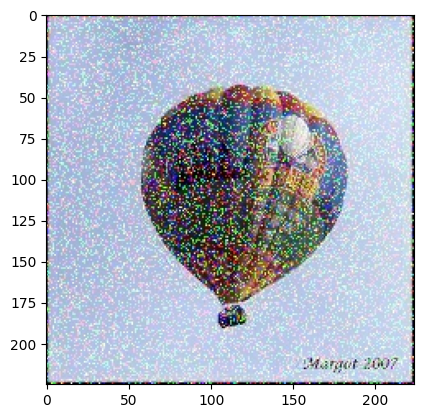

balloon 0.9906144142150879
chiton, coat-of-mail shell, sea cradle, polyplacophore 0.0034231122117489576
parachute, chute 0.0023196355905383825
bubble 0.002262994647026062
maraca 0.0002051715855486691




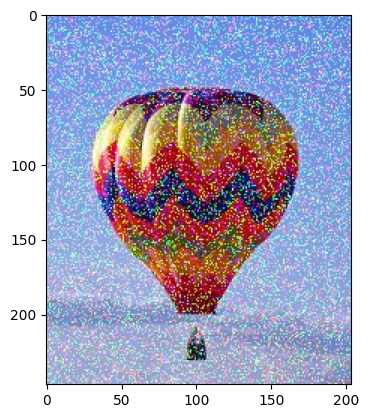

balloon 0.7550517916679382
bubble 0.08542009443044662
fountain 0.03343166410923004
umbrella 0.01960153877735138
chiton, coat-of-mail shell, sea cradle, polyplacophore 0.01820165105164051




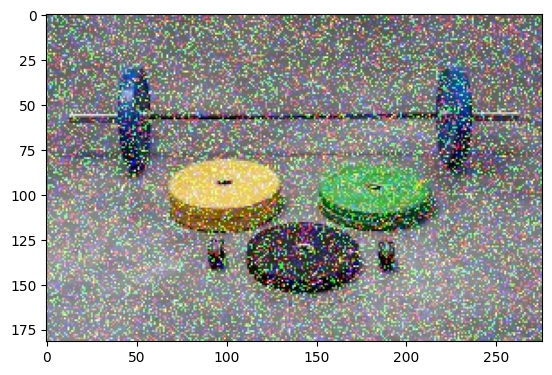

bottlecap 0.44096240401268005
manhole cover 0.33589547872543335
maze, labyrinth 0.03307226300239563
doormat, welcome mat 0.026975294575095177
wallet, billfold, notecase, pocketbook 0.012051126919686794




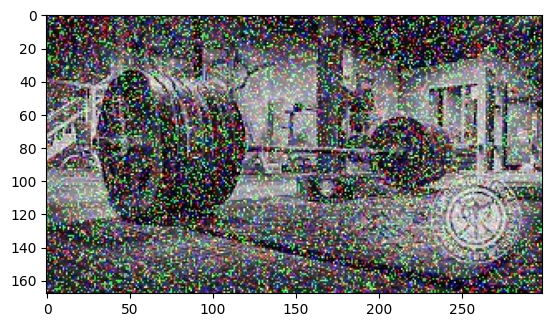

maze, labyrinth 0.24234725534915924
plow, plough 0.06888264417648315
manhole cover 0.04667014628648758
fountain 0.033936746418476105
hay 0.03270028904080391




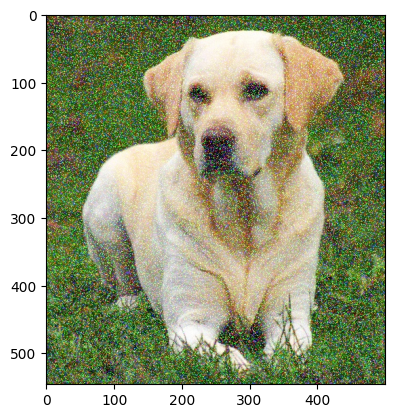

Labrador retriever 0.9526573419570923
golden retriever 0.021873900666832924
bull mastiff 0.010030258446931839
American Staffordshire terrier, Staffordshire terrier, American pit bull terrier, pit bull terrier 0.002309722127392888
Rhodesian ridgeback 0.0021770873572677374




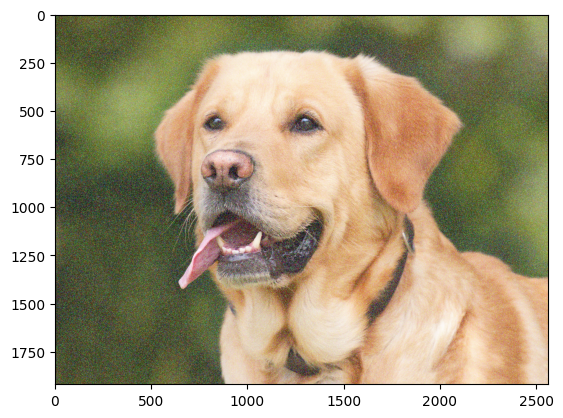

Labrador retriever 0.6712518930435181
golden retriever 0.18946117162704468
Chesapeake Bay retriever 0.028833134099841118
tennis ball 0.022212086245417595
Rhodesian ridgeback 0.01637423038482666




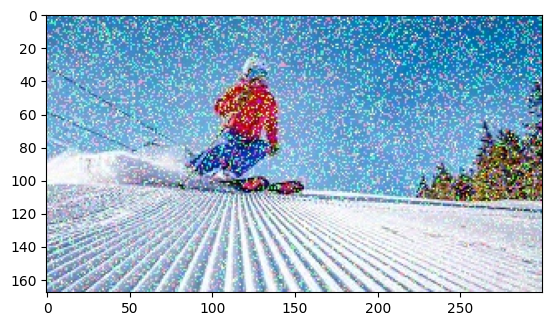

fountain 0.6672990322113037
umbrella 0.12417087703943253
parachute, chute 0.056062888354063034
solar dish, solar collector, solar furnace 0.007508861366659403
speedboat 0.007474951911717653




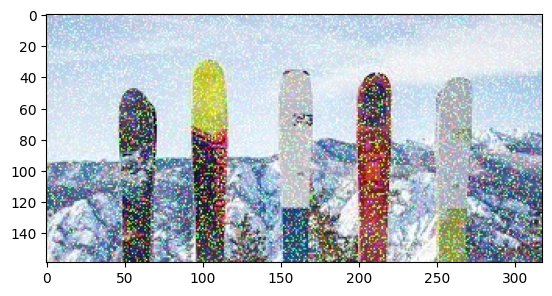

ski 0.8108175992965698
ballpoint, ballpoint pen, ballpen, Biro 0.053293995559215546
ice lolly, lolly, lollipop, popsicle 0.0282126534730196
rubber eraser, rubber, pencil eraser 0.01628836989402771
Band Aid 0.012743853032588959




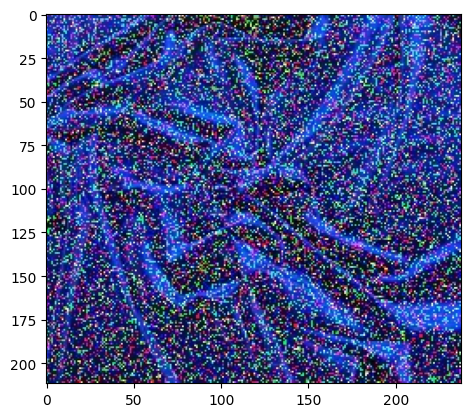

stole 0.6161297559738159
velvet 0.11168244481086731
poncho 0.0932585820555687
wool, woolen, woollen 0.07048884779214859
jean, blue jean, denim 0.03179090842604637




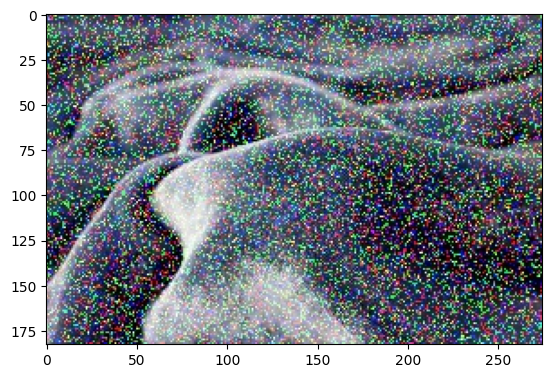

king penguin, Aptenodytes patagonica 0.10760445892810822
great white shark, white shark, man-eater, man-eating shark, Carcharodon carcharias 0.09940891712903976
electric ray, crampfish, numbfish, torpedo 0.05884449556469917
miniature pinscher 0.049474265426397324
hammerhead, hammerhead shark 0.03767452389001846


Predicted labels =  ['balloon', 'balloon', 'bottlecap', 'maze, labyrinth', 'Labrador retriever', 'Labrador retriever', 'fountain', 'ski', 'stole', 'king penguin, Aptenodytes patagonica']
Actual labels =  ['balloon', 'balloon', 'barbell', 'barbell', 'Labrador retriever', 'Labrador retriever', 'ski', 'ski', 'velvet', 'velvet']


In [7]:
# Problem 4 - Problem 1 + Gaussian Noise on input

import torch
import os
from PIL import Image
from torchvision import transforms
from sklearn.metrics import confusion_matrix
from sklearn.metrics import classification_report
import seaborn as sn
import pandas as pd
import urllib
import numpy as np
import cv2
import matplotlib.pyplot as plt
from matplotlib import cm


# Debug variables
DEBUG=1


device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")
model = torch.hub.load('pytorch/vision:v0.10.0', 'resnet50', pretrained=True)
model = model.to(device)
model.eval()


preprocess = transforms.Compose([
    transforms.Resize(256),
    transforms.CenterCrop(224),
    transforms.ToTensor(),
    transforms.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225]),
])

# Folder names
test_folder = "dataset"
noisy_folder = "noisy_folder"
project_folder = os.getcwd()
test_folder = os.path.join(project_folder,test_folder)
noisy_folder = os.path.join(project_folder,noisy_folder)
noisy_image_path_arr = []
print(noisy_folder)

# Arrays for predictions and actual values
y_pred = []
y_true = []




# Add noise to dataset and perform evaluation in model
for folder in os.listdir(test_folder):
    sub_directory = (os.path.join(test_folder,folder))
    if (os.path.isdir(sub_directory) == False): continue
    for filename in os.listdir(sub_directory):
        label = folder
        filename_path = os.path.join(sub_directory,filename)
        original_img = cv2.imread(filename_path)
        if (DEBUG): # if debug, then print input images
            img = cv2.imread(filename_path)
            plt.imshow(img[:,:,::-1])
            plt.show()
        
        # Generate Gaussian noise
        gauss = np.random.normal(0,1,original_img.size)
        gauss = gauss.reshape(original_img.shape[0],original_img.shape[1],original_img.shape[2]).astype('uint8')
        # Add the Gaussian noise to the image
        img_gauss = cv2.add(original_img,gauss)
        noisy_image_name = "noisy_"+ filename
        noisy_image_path = os.path.join(noisy_folder,noisy_image_name)
        noisy_image_path_arr.append([label,noisy_image_path])
        cv2.imwrite(noisy_image_path,img_gauss)



        
# Evaluation, iterate through array with paths to noisy images
for label,path in noisy_image_path_arr:
        noisy_image = Image.open(path)
        if (DEBUG): # if debug, then print input images
            img = cv2.imread(path)
            plt.imshow(img[:,:,::-1])
            plt.show()
        input_tensor = preprocess(noisy_image)
        input_batch = input_tensor.unsqueeze(0) # create a mini-batch as expected by the model
        input_batch = input_batch.to('cuda')

        with torch.no_grad():
            output = model(input_batch)
        
        probabilities = torch.nn.functional.softmax(output[0], dim=0)

        # Read the categories
        with open("imagenet_classes.txt", "r") as f:
            categories = [s.strip() for s in f.readlines()]
        # Show top categories per image
        top5_prob, top5_catid = torch.topk(probabilities, 5)
        for i in range(top5_prob.size(0)):
            print(categories[top5_catid[i]], top5_prob[i].item())
        print("\n")
        y_pred.append(categories[top5_catid[0]]) # Save Prediction
        y_true.append(label)




print("Predicted labels = ", y_pred)
print("Actual labels = ", y_true)
